In [1]:
from population import PopulationGeneratorConfig, Distance, PopulationGenerationDistributionKind, PopulationGenerationEpicentre, generate_data_points
from clusters import Cluster, get_paths_between_clusters, ClusterCentreStrategy
from utils import visualize_clusters, visualize_points, visualize_paths
import h3
import pathlib
import folium
import osmnx
import networkx as nx

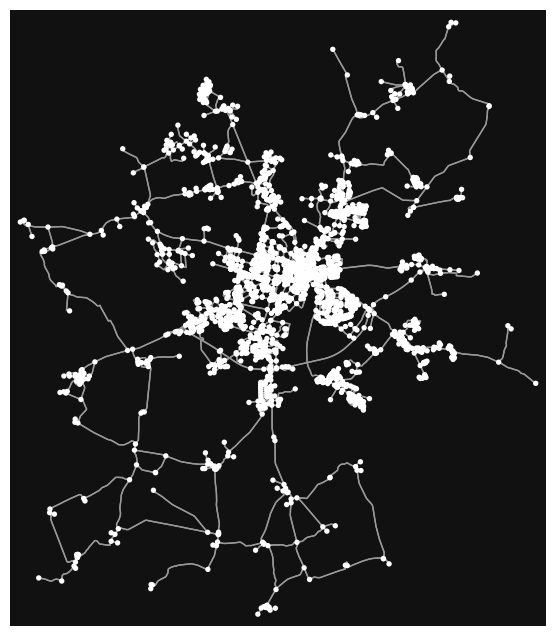

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [2]:
config = PopulationGeneratorConfig.from_json_file(pathlib.Path("configs/slupsk_2004.json"))
cluster_centre_strategy = ClusterCentreStrategy.HEXAGON_CENTER
pts_by_epi = {epi.label: generate_data_points(epi) for epi in config.epicentres}

colors = ["blue", "red", "green"]
pts_by_color = list(zip(colors, pts_by_epi.values()))
points = [point for pts in pts_by_epi.values() for point in pts]
places = [
    'Słupsk, Polska',
    'gmina Słupsk, Polska',
    'gmina Kobylnica, Polska',
]
# custom_filter = '["highway"~"motorway|primary|secondary|tertiary|unclassified"]'
custom_filter = None
graph = osmnx.graph.graph_from_place(places, network_type="drive", custom_filter=custom_filter)
graph = osmnx.speed.add_edge_travel_times(osmnx.add_edge_speeds(graph))
# osmnx.speed.add_edge_travel_times(graph)
clusters = Cluster.clusterize_points(points, 8, cluster_centre_strategy)
osmnx.plot_graph(graph)

In [3]:
atlas = get_paths_between_clusters(graph, clusters)
paths = atlas.get_paths()
paths

[[2325759676, 1838566846, 1839233259, 1839233258, 1839231530, 1839231525],
 [2325759676,
  1161201994,
  258136118,
  2687743807,
  258136938,
  258136905,
  2618487308,
  2964914500,
  1970567647,
  1970567639,
  1970567624],
 [2325759676,
  1161201994,
  258136118,
  2687743807,
  258135867,
  2404030001,
  1161655143,
  1156507387,
  1161674639,
  1161674577,
  1970598277],
 [2325759676,
  1838566846,
  1839233259,
  1838566880,
  1838566881,
  1838566882,
  1838566895,
  2960242359,
  1838566814],
 [2325759676,
  1838566846,
  1838566877,
  258134877,
  1165281708,
  258135850,
  2964917054,
  2643735894,
  1839245009,
  2686308591,
  1364154229,
  2688499962,
  258135185,
  258135213,
  2643686351,
  1839245033,
  1970647619,
  2325837715,
  1970647641,
  1970647648,
  10655764766],
 [2325759676,
  1161201994,
  258136118,
  2357104923,
  1839245011,
  258136131,
  3973222494,
  258136187,
  2964923046,
  2965755332],
 [2325759676, 1838566846, 1839233259, 1839233258, 1839231530, 1

In [4]:
m = folium.Map(location=[54.46270136314862, 17.019373399360482], zoom_start=13, tiles='cartodbpositron')
visualize_paths(m, graph, paths)
visualize_clusters(m, clusters, ['green'])
visualize_points(m, [cluster.centre for cluster in clusters], ['red'])
m

In [5]:
osmnx.folium.plot_graph_folium(graph, graph_map=m)